# Tidy Tuesday Project for September 17th, 2024

Hello there, folks!  I am coming at you with my first #tidytuesday project.  I am currently learning the [Julia](https://julialang.org/) programming language, and so that is what I am going to use in this notebook.

Please feel free to critique me if you are a Julia programmer!

## The Shakespeare Dialogue Dataset

Thanks to [nrennie](https://github.com/nrennie), we have access to a dataset that you can find --> [here](https://github.com/nrennie/shakespeare).

The author of the dataset we are using webscraped the data from [here](https://shakespeare.mit.edu/).

#### Fun Fact...

I have never read any of Shakespeare's material, nor have I ever seen one of the plays representing the works discussed in this project.  As such, I am going to explore this from the perspective of someone that wants to know how these plays will flow.  I want to know which play has the longest lines, which play is the longest overall, and which play has longer Acts with varying scenes.

Let's get to it!

### Setup

In [1]:
# import Pkg and then other required packages
using Pkg
Pkg.add(["CSV", "DataFrames", "HTTP", "Statistics", "StatsPlots", "Plots"])

# load
using CSV, DataFrames, HTTP, Statistics, StatsPlots, Plots

   Resolving package versions...
  No Changes to `C:\Users\ndfos\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\ndfos\.julia\environments\v1.10\Manifest.toml`


### Import data

In [2]:
# Read directly from GitHub
hamlet_url="https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2024/2024-09-17/hamlet.csv"
macbeth_url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2024/2024-09-17/macbeth.csv"
romeo_juliet_url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2024/2024-09-17/romeo_juliet.csv"

# Create DataFrames
hamlet = CSV.read(HTTP.get(hamlet_url).body, DataFrame)
macbeth = CSV.read(HTTP.get(macbeth_url).body, DataFrame)
romeo_juliet = CSV.read(HTTP.get(romeo_juliet_url).body, DataFrame);


### Hamlet 📚

In [3]:
# Basic Description
println("We will want to take note of the fact that `line_number` is a string variable.")

describe(hamlet)

We will want to take note of the fact that `line_number` is a string variable.


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Nothing,Abstract…,Nothing,Abstract…,Int64,DataType
1,act,,Act I,,Act V,0,String7
2,scene,,Scene I,,Scene VII,0,String15
3,character,,All,,[stage direction],0,String31
4,dialogue,,'And in part him; but' you may say 'not well:,,"yourself. But indeed, if you find him not within",0,String
5,line_number,,1,,NA,0,String7


In [4]:
# Number of unique characters
unique_characters = unique(hamlet.character)
println("Number of unique characters: ", length(unique_characters))

Number of unique characters: 36


In [5]:
# Most frequent characters
character_counts = combine(groupby(hamlet, :character), nrow => :Count)
sorted_counts = sort(character_counts, :Count, rev=true)
println("Top 10 Most frequent characters:\n", sorted_counts[1:10,:])

Top 10 Most frequent characters:
10×2 DataFrame
 Row │ character          Count 
     │ String31           Int64 
─────┼──────────────────────────
   1 │ Hamlet              1495
   2 │ King Claudius        546
   3 │ Lord Polonius        355
   4 │ Horatio              289
   5 │ [stage direction]    206
   6 │ Laertes              206
   7 │ Ophelia              173
   8 │ Queen Gertrude       157
   9 │ Ghost                 95
  10 │ First Clown           94


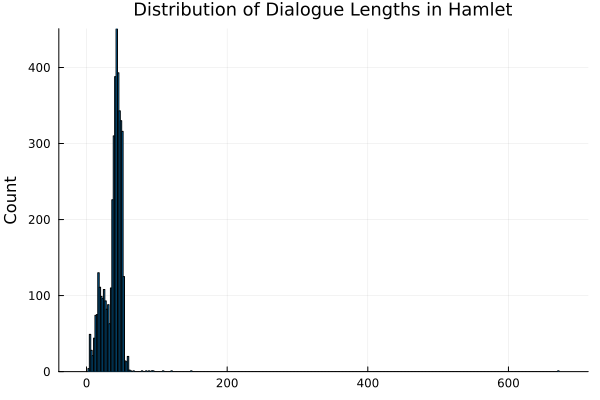

In [6]:
# Distribution of dialogue lengths
hamlet.dialogue_length = length.(hamlet.dialogue)

hamlet_hist = 
histogram(hamlet.dialogue_length, 
title="Distribution of Dialogue Lengths in Hamlet", 
xlabel="", 
ylabel="Count",
legend=false,
titlefontsize=12
)

### Something is up with the `line_number` column.  Let's take a look.

In [7]:
# check out unique values within line_number
println("Clearly, there is a vagrant 'NA' value in or data that will not allow for line_number to be continuous.")
unique(hamlet.line_number)

Clearly, there is a vagrant 'NA' value in or data that will not allow for line_number to be continuous.


4012-element Vector{String7}:
 "NA"
 "1"
 "2"
 "3"
 "4"
 "5"
 "6"
 "7"
 "8"
 "9"
 ⋮
 "4003"
 "4004"
 "4005"
 "4006"
 "4007"
 "4008"
 "4009"
 "4010"
 "4011"

### Line_number has some "NA" values.  Let's take a closer look.

In [8]:
# view rows that have line_number == "NA"
println("We can see that these are instances of stage direction, there are no lines. To show the behavior of character dialogue in the data. \nWe can remove these rows and deal with the rest of the data.\nWe will create a new dataframe for this so as to be able to go back and analyze the stage direction further if desired.")
hamlet[hamlet.line_number .== "NA", :]

We can see that these are instances of stage direction, there are no lines. To show the behavior of character dialogue in the data. 
We can remove these rows and deal with the rest of the data.
We will create a new dataframe for this so as to be able to go back and analyze the stage direction further if desired.


Row,act,scene,character,dialogue,line_number,dialogue_length
,String7,String15,String31,String,String7,Int64
1,Act I,Scene I,[stage direction],FRANCISCO at his post. Enter to him BERNARDO,NA,44
2,Act I,Scene I,[stage direction],Enter HORATIO and MARCELLUS,NA,27
3,Act I,Scene I,[stage direction],Exit,NA,4
4,Act I,Scene I,[stage direction],Enter Ghost,NA,11
5,Act I,Scene I,[stage direction],Exit Ghost,NA,10
6,Act I,Scene I,[stage direction],Re-enter Ghost,NA,14
7,Act I,Scene I,[stage direction],Cock crows,NA,10
8,Act I,Scene I,[stage direction],Exit Ghost,NA,10
9,Act I,Scene I,[stage direction],Exeunt,NA,6


### Ok, in order to plot the line_number, we might want to convert to Int64 format.  Let's do it.

The truth is, we will likely have to do this across all three files, and so why not create a function to make the code more readable and the analysis more reproducible.

In [9]:
# Define the function with type checking and error handling
function shakespeare_impute(df::DataFrame, col::Symbol;
    not_value="NA", 
    impute_with=missing, 
    format=Int)
# Replace `not_value` with `impute_with` in the specified column
df[!, col]=replace(df[!, col], not_value => impute_with)

# Remove rows with missing values in the specified column
df_clean=dropmissing(df, col)

# parse the format of the new column

df_clean[!, col]=parse.(format, df_clean[!, col])

return df_clean  # Return the modified DataFrame

end

shakespeare_impute (generic function with 1 method)

In [10]:
# deal with the format of line_number
# Replace "NA" with missing values
# Remove rows with missing line numbers
# parse strings into integers
# via shakespeare_impute()

hamlet_no_stage_direction=shakespeare_impute(hamlet, :line_number)

describe(hamlet_no_stage_direction)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,act,,Act I,,Act V,0,String7
2,scene,,Scene I,,Scene VII,0,String15
3,character,,All,,Voltimand,0,String31
4,dialogue,,'And in part him; but' you may say 'not well:,,"yourself. But indeed, if you find him not within",0,String
5,line_number,2006.0,1,2006.0,4011,0,Int64
6,dialogue_length,38.2653,3,41.0,62,0,Int64


### That method worked via our custom function.

Now, let's plot the acts and line numbers colored by scene.

Here, we can compare the number of lines in each act,
potentially showing us which acts include more dialogue.


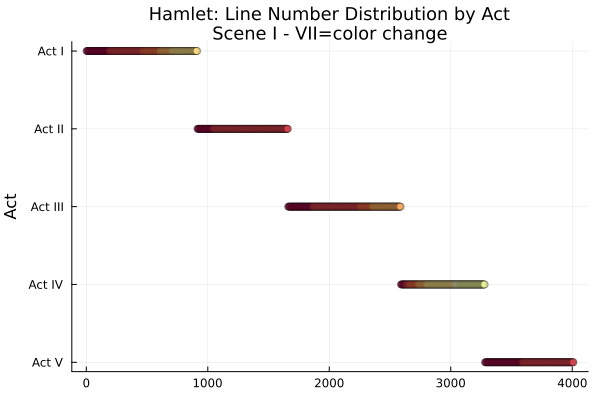

In [11]:
# Plot example using updated DataFrame
println("Here, we can compare the number of lines in each act,\npotentially showing us which acts include more dialogue.")

hamlet_scatter=
@df hamlet_no_stage_direction scatter(:line_number, 
        :act,
        group=:scene,
        palette=:Spectral,
        markeralpha=0.1,
        legend=false,
        title="Hamlet: Line Number Distribution by Act\nScene I - VII=color change", 
        xlabel="", 
        ylabel="Act",
        titlefontsize=12
)
yflip!()

hamlet_scatter

### Macbeth 🗡️

In [12]:
# Basic Description
describe(macbeth)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Nothing,Abstract…,Nothing,Abstract…,Int64,DataType
1,act,,Act I,,Act V,0,String7
2,scene,,Scene I,,Scene VIII,0,String15
3,character,,All,,[stage direction],0,String31
4,dialogue,,"'Aroint thee, witch!' the rump-fed ronyon cries.",,your pardon;,0,String
5,line_number,,1,,NA,0,String7


In [13]:
# Number of unique characters
unique_characters_macbeth=unique(macbeth.character)
println("Number of unique characters: ", length(unique_characters_macbeth))

Number of unique characters: 42


In [14]:
# Most frequent characters
character_counts_macbeth=combine(groupby(macbeth, :character), nrow => :Count)
sorted_counts_macbeth=sort(character_counts_macbeth, :Count, rev=true)
println("Top 10 Most frequent characters:\n", sorted_counts_macbeth[1:10, :])

Top 10 Most frequent characters:
10×2 DataFrame
 Row │ character          Count 
     │ String31           Int64 
─────┼──────────────────────────
   1 │ Macbeth              717
   2 │ Lady Macbeth         265
   3 │ Malcolm              212
   4 │ Macduff              180
   5 │ [stage direction]    169
   6 │ Ross                 135
   7 │ Banquo               113
   8 │ Lennox                74
   9 │ Duncan                70
  10 │ First Witch           62


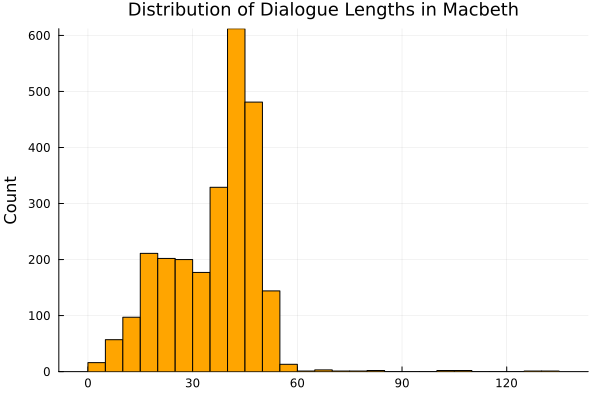

In [15]:
# Distribution of dialogue lengths
macbeth.dialogue_length=length.(macbeth.dialogue)

macbeth_hist=histogram(macbeth.dialogue_length, 
title="Distribution of Dialogue Lengths in Macbeth", 
xlabel="", 
ylabel="Count",
legend=false,
color=:orange,
titlefontsize=12
)

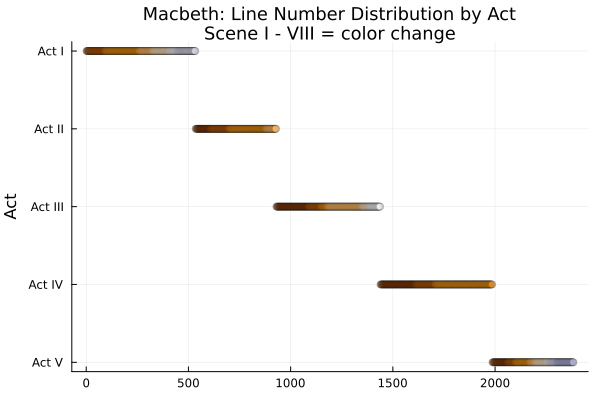

In [16]:
# utilize the custom function to improve the scatterplot below

macbeth_no_stage_direction = shakespeare_impute(macbeth, :line_number)

# Plot line number distribution by act and scene
macbeth_scatter =
@df macbeth_no_stage_direction scatter(:line_number, 
:act, 
group=:scene,
palette=:PuOr,
markeralpha=0.1, 
legend=false, 
title="Macbeth: Line Number Distribution by Act\nScene I - VIII = color change", 
xlabel="", 
ylabel="Act",
titlefontsize=12
)
yflip!()

macbeth_scatter

### Romeo & Juliet ❤️

In [17]:
# Basic Description
describe(romeo_juliet)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Nothing,Abstract…,Nothing,Abstract…,Int64,DataType
1,act,,Act I,,Act V,0,String7
2,scene,,Prologue,,Scene VI,0,String15
3,character,,Abraham,,[stage direction],0,String31
4,dialogue,,"'An if a man did need a poison now,",,"your pate. I will carry no crotchets: I'll re you,",0,String
5,line_number,,1,,NA,0,String7


In [18]:
# Number of unique characters
unique_characters_rj = unique(romeo_juliet.character)
println("Number of unique characters: ", length(unique_characters_rj))

Number of unique characters: 35


In [19]:
# Most frequent characters
character_counts_rj = combine(groupby(romeo_juliet, :character), nrow => :Count)
sorted_counts_rj = sort(character_counts_rj, :Count, rev=true)
println("Top 10 Most frequent characters:\n", sorted_counts_rj[1:10, :])

Top 10 Most frequent characters:
10×2 DataFrame
 Row │ character          Count 
     │ String31           Int64 
─────┼──────────────────────────
   1 │ Romeo                612
   2 │ Juliet               544
   3 │ Friar Laurence       351
   4 │ Nurse                281
   5 │ Capulet              273
   6 │ Mercutio             261
   7 │ [stage direction]    189
   8 │ Benvolio             160
   9 │ Lady Capulet         115
  10 │ Prince                76


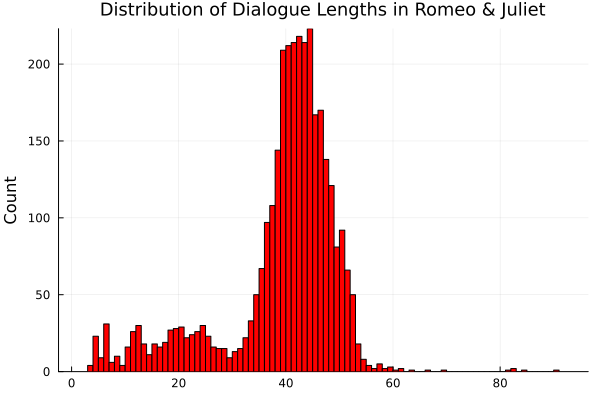

In [20]:
# Distribution of dialogue lengths
romeo_juliet.dialogue_length = length.(romeo_juliet.dialogue)

rj_hist = histogram(romeo_juliet.dialogue_length, 
title="Distribution of Dialogue Lengths in Romeo & Juliet", 
xlabel="", 
ylabel="Count",
color=:red,
legend=false,
titlefontsize=12
)

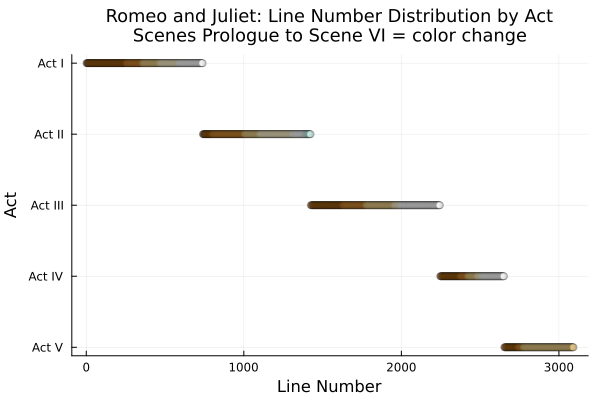

In [21]:
# deal with line_number formatting
rj_no_stage_direction = shakespeare_impute(romeo_juliet, :line_number)

# Plot line number distribution by act and scene
rj_scatter = 
@df rj_no_stage_direction scatter(:line_number, 
:act, 
group=:scene,
markeralpha=0.1,
palette=:BrBg, 
legend=false, 
title="Romeo and Juliet: Line Number Distribution by Act\nScenes Prologue to Scene VI = color change\n", 
xlabel="Line Number", 
ylabel="Act",
titlefontsize=12
)
yflip!()

### Answering the questions about `Macbeth`, `Hamlet`, and `Romeo and Juliet`!

Now we will bring this work together.

- which play has the longest lines, 

- which play is the longest overall, and 

- which play has longer Acts with varying scene length

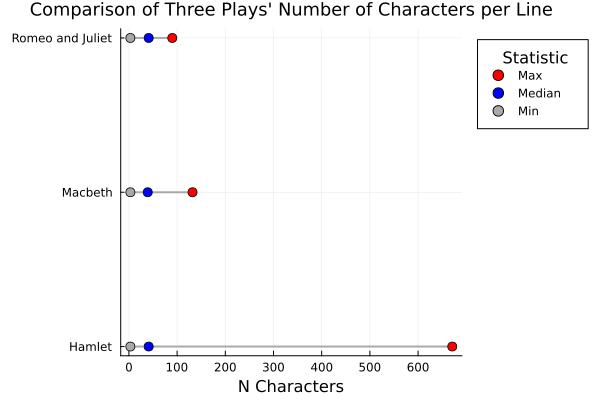

In [44]:
# summarize each DataFrame

# hamlet
hamlet_summary = combine(hamlet, :dialogue_length .=> [minimum, median, maximum] .=> [:Min, :Median, :Max])
hamlet_summary.Play = ["Hamlet"] # add the character string to identify each row as a play

# macbeth
macbeth_summary = combine(macbeth, :dialogue_length .=> [minimum, median, maximum] .=> [:Min, :Median, :Max])
macbeth_summary.Play = ["Macbeth"]

# romeo and Juliet
romeo_juliet_summary = combine(romeo_juliet, :dialogue_length .=> [minimum, median, maximum] .=> [:Min, :Median, :Max])
romeo_juliet_summary.Play = ["Romeo and Juliet"]

# union
line_comparison_cat = vcat(hamlet_summary, macbeth_summary, romeo_juliet_summary)

# pivot longer

line_comparison_pivot = stack(line_comparison_cat, [:Min, :Median, :Max])

# set more intuitive names

line_comparison_df = rename!(line_comparison_pivot, Dict(

:variable => :Type,
:value => :Stat

))

# Construct the dumbbell plot
line_comparison_plot = 
@df line_comparison_df Plots.plot(:Stat, :Play, color=:darkgray, group=:Play, z_order=:back, linewidth = 2, legend=false, label="")
@df line_comparison_df scatter!(:Stat, :Play, 
group=:Type, markersize = 5, 
color=[:red :blue :darkgray], 
z_order=:front, 
legend = :outertopright,
xlabel = "N Characters",
ylabel = "",
title = "Comparison of Three Plays' Number of Characters per Line",
titlefontsize = 12,
legendtitle = "Statistic"
)

### Hamlet has some long lines!

Maybe not always at the ticket booth, but definitely in the text itself...

Let's compare the distributions of the three plays' number of characters per line.

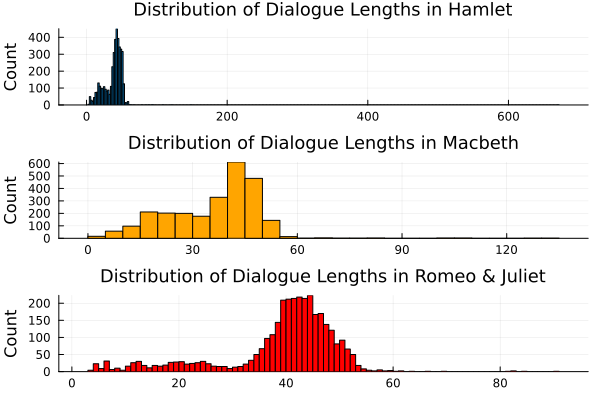

In [23]:
# create a vector of histograms
histogram_vector = [hamlet_hist macbeth_hist rj_hist]

# plot the histograms together in one viewport
Plots.plot(histogram_vector..., layout=(3,1))

### An Overview of the Structure of Three Great Plays

Admittedly, I have never read or seen these plays, but they are truly great.  Shakespeare created these masterpieces that have stood the test of time.  You might be like me and would like a summary of what to expect regarding the flow of these plays.

Here is the final plot of this exploration of the `hamlet.csv`, `macbeth.csv`, and `romeo_juliet.csv` datasets.

Another big thanks to [nrennie](https://github.com/nrennie) for a great opportunity to contribute.

Happy analyzing!

Here, we can see that Hamlet is the longest play of them all, with Romeo and Juliet coming in second.
Each play has a slightly different structure with regard to how scenes are distributed within each act, and how long each act is.
I hope you enjoyed reviewing this analysis, and that hyou get movitated to contribute to Tidy Tuesday as well!


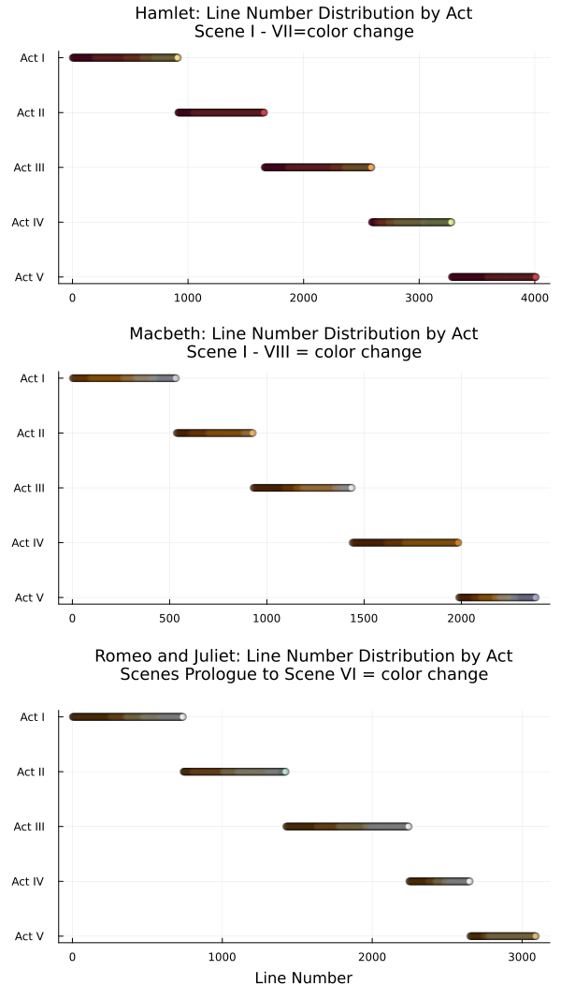

In [24]:
# create a vector of the three dotplots

println("Here, we can see that Hamlet is the longest play of them all, with Romeo and Juliet coming in second.\nEach play has a slightly different structure with regard to how scenes are distributed within each act, and how long each act is.\nI hope you enjoyed reviewing this analysis, and that hyou get movitated to contribute to Tidy Tuesday as well!")
dotplot_vector = [hamlet_scatter macbeth_scatter rj_scatter]

Plots.plot(dotplot_vector..., layout=(3,1), size=(600, 1068))